<a href="https://colab.research.google.com/github/GFDRR/disaster-fcv-colocation-mapping/blob/master/examples/demo2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Imports and Setup

Note: after running the first cell, you will be prompted to restart the session. Hit `Restart session` and continue running the rest of the cells.

In [ ]:
!pip install --index-url https://test.pypi.org/simple/ --extra-index-url https://pypi.org/simple/ dfcv-colocation-mapping==0.3.6

In [ ]:
!apt install gdal-bin

In [3]:
import warnings
warnings.filterwarnings(action="ignore", message=r"datetime.datetime.utcnow")

from dfcv_colocation_mapping import data_download
from dfcv_colocation_mapping import data_utils
from dfcv_colocation_mapping import map_utils

import re
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)

## Download Datasets

In [5]:
iso_code = "RWA (Rwanda)"  # @param ["ABW (Aruba)", "AGO (Angola)", "AIA (Anguilla)", "ARG (Argentina)", "ATG (Antigua and Barbuda)", "BDI (Burundi)", "BEN (Benin)", "BFA (Burkina Faso)", "BGD (Bangladesh)", "BHS (The Bahamas)", "BLM (Saint Barthelemy)", "BLZ (Belize)", "BOL (Bolivia)", "BRA (Brazil)", "BRB (Barbados)", "BRN (Brunei)", "BTN (Bhutan)", "BWA (Botswana)", "CAF (Central African Republic)", "CHL (Chile)", "CIV (Ivory Coast)", "CMR (Cameroon)", "COD (Democratic Republic of the Congo)", "COG (Republic of Congo)", "COL (Colombia)", "COM (Comoros)", "CPV (Cape Verde)", "CRI (Costa Rica)", "CUB (Cuba)", "CUW (Cura\u00e7ao)", "CYM (Cayman Islands)", "DJI (Djibouti)", "DMA (Dominica)", "DOM (Dominican Republic)", "DZA (Algeria)", "ECU (Ecuador)", "EGY (Egypt)", "ERI (Eritrea)", "ETH (Ethiopia)", "FLK (Falkland Islands)", "GAB (Gabon)", "GHA (Ghana)", "GIN (Guinea)", "GMB (Gambia)", "GNB (Guinea Bissau)", "GNQ (Equatorial Guinea)", "GRD (Grenada)", "GTM (Guatemala)", "GUY (Guyana)", "HND (Honduras)", "HTI (Haiti)", "IDN (Indonesia)", "IND (India)", "IOT (British Indian Ocean Territory)", "JAM (Jamaica)", "KEN (Kenya)", "KHM (Cambodia)", "KNA (Saint Kitts and Nevis)", "LAO (Laos)", "LBR (Liberia)", "LCA (Saint Lucia)", "LKA (Sri Lanka)", "LSO (Lesotho)", "MAF (Saint Martin)", "MDG (Madagascar)", "MDV (Maldives)", "MEX (Mexico)", "MOZ (Mozambique)", "MRT (Mauritania)", "MSR (Montserrat)", "MUS (Mauritius)", "MWI (Malawi)", "MYS (Malaysia)", "MYT (Mayotte)", "NAM (Namibia)", "NER (Niger)", "NGA (Nigeria)", "NIC (Nicaragua)", "NPL (Nepal)", "PAN (Panama)", "PER (Peru)", "PHL (Philippines)", "PRI (Puerto Rico)", "PRY (Paraguay)", "RWA (Rwanda)", "SDN (Sudan)", "SEN (Senegal)", "SGP (Singapore)", "SHN (Saint Helena)", "SLE (Sierra Leone)", "SLV (El Salvador)", "SOM (Somalia)", "STP (Sao Tome and Principe)", "SUR (Suriname)", "SWZ (Eswatini)", "SXM (Sint Maarten)", "SYC (Seychelles)", "TCA (Turks and Caicos Islands)", "TGO (Togo)", "THA (Thailand)", "TLS (East Timor)", "TTO (Trinidad and Tobago)", "TUN (Tunisia)", "TZA (United Republic of Tanzania)", "UGA (Uganda)", "URY (Uruguay)", "VCT (Saint Vincent and the Grenadines)", "VEN (Venezuela)", "VGB (British Virgin Islands)", "VIR (United States Virgin Islands)", "VNM (Vietnam)", "ZAF (South Africa)", "ZMB (Zambia)", "ZWE (Zimbabwe)"]
iso_code = re.sub(r'\([^)]*\)', '', iso_code).strip()
adm_level = "ADM3" # @param ["ADM1", "ADM2", "ADM3"]

conflict_start_date = "2015-01-01" # @param {type: "date"}
conflict_end_date = "2025-01-01" # @param {type: "date"}

mhs_aggregation= "power_mean" # @param ["power_mean", "arithmetic_mean", "geometric_mean"]

acled_key = None # @param {type: "string"}
acled_email = None # @param {type: "string"}

dm = data_download.DatasetManager(
    iso_code,
    adm_level=adm_level,
    conflict_start_date=conflict_start_date,
    conflict_end_date=conflict_end_date,
    mhs_aggregation=mhs_aggregation,
    acled_key=acled_key,
    acled_email=acled_email
)
geoplot = map_utils.GeoPlot(dm)
dm.data.sort_values(f"mhs_ucdp_worldpop_exposure_relative", ascending=False).head(3)

INFO:root:Loading geoboundary...
INFO:root:Loading asset and hazard layers...
INFO:root:Downloading conflict data from 2015-01-01 to 2025-01-01
INFO:root:Loading ACLED conflict data...
INFO:root:Loading UCDP conflict data...
INFO:root:Calculating scores...


,iso_code,ADM3,ADM3_ID,ADM2_ID,ADM2,ADM1_ID,ADM1,worldpop,geometry,earthquake,earthquake_worldpop_exposure,earthquake_worldpop_intensity_weighted_exposure,landslide,landslide_worldpop_exposure,landslide_worldpop_intensity_weighted_exposure,cyclone,cyclone_worldpop_exposure,cyclone_worldpop_intensity_weighted_exposure,drought,drought_worldpop_exposure,drought_worldpop_intensity_weighted_exposure,heat_stress,heat_stress_worldpop_exposure,heat_stress_worldpop_intensity_weighted_exposure,fluvial_flood,fluvial_flood_worldpop_exposure,fluvial_flood_worldpop_intensity_weighted_exposure,acled_population_best,acled_conflict_count,acled_null_conflict_count,acled_exposure,wbg_acled_worldpop_exposure,ucdp_conflict_count,ucdp_worldpop_exposure,earthquake_worldpop_exposure_relative,earthquake_worldpop_intensity_weighted_exposure_relative,landslide_worldpop_exposure_relative,landslide_worldpop_intensity_weighted_exposure_relative,cyclone_worldpop_exposure_relative,cyclone_worldpop_intensity_weighted_exposure_relative,drought_worldpop_exposure_relative,drought_worldpop_intensity_weighted_exposure_relative,heat_stress_worldpop_exposure_relative,heat_stress_worldpop_intensity_weighted_exposure_relative,fluvial_flood_worldpop_exposure_relative,fluvial_flood_worldpop_intensity_weighted_exposure_relative,acled_exposure_relative,wbg_acled_worldpop_exposure_relative,ucdp_worldpop_exposure_relative,mhs_worldpop_exposure_relative,mhs_wbg_acled_worldpop_exposure_relative,mhs_ucdp_worldpop_exposure_relative,mhs_worldpop_intensity_weighted_exposure_relative,mhs_wbg_acled_worldpop_intensity_weighted_exposure_relative,mhs_ucdp_worldpop_intensity_weighted_exposure_relative
170,RWA,Nyamyumba,94199721B54264211227542,40016504B41870686260998,Rubavu,46589978B43518966718904,Western Province,46052.453125,"POLYGON ((29.31081 -1.73826, 29.31066 -1.73782...",0.208933,46052.453125,37130.050781,3.191489,45274.078125,40167.820312,0.002091,0.0,0.0,1.599028,0.0,0.0,2029.780488,0.0,0.0,0.0,0.0,0.0,NaN,1.0,1.0,NaN,46052.453125,3.0,45420.230469,1.0,0.806256,0.983098,0.872219,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,1.0,0.986272,0.596515,0.596515,0.588322,0.636313,0.636313,0.627573
173,RWA,Rugerero,94199721B25246697837793,40016504B41870686260998,Rubavu,46589978B43518966718904,Western Province,71924.945312,"POLYGON ((29.27015 -1.71473, 29.27041 -1.71484...",0.208847,71924.945312,57371.257812,2.791667,47125.546875,42090.910156,0.001947,0.0,0.0,1.599028,0.0,0.0,2420.042553,0.0,0.0,0.0,0.0,0.0,264394.0,18.0,8.0,26439.4,71924.945312,2.0,71924.945312,1.0,0.797655,0.655204,0.585206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.367597,1.0,1.000000,0.492432,0.492432,0.492432,0.521335,0.521335,0.521335
151,RWA,Kigeyo,94199721B42838117711864,40016504B58353894398581,Rutsiro,46589978B43518966718904,Western Province,25719.466797,"MULTIPOLYGON (((29.28695 -1.83343, 29.28715 -1...",0.208546,25719.466797,20602.261719,3.142857,23301.015625,20119.552734,0.003107,0.0,0.0,1.456254,0.0,0.0,1970.093750,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,2.0,20868.861328,1.0,0.801038,0.905968,0.782269,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.811403,0.572975,NaN,0.464863,0.600446,NaN,0.487150


## AHP Weight Calculation [Optional]

In [ ]:
dm.calculate_ahp()
geoplot = map_utils.GeoPlot(dm)
dm.data.sort_values("mhs_worldpop_exposure_relative", ascending=False).head(3)

How much more important is earthquake compared to landslide: 1
How much more important is earthquake compared to cyclone: 1
How much more important is earthquake compared to drought: 1
How much more important is earthquake compared to heat_stress: 1
How much more important is earthquake compared to fluvial_flood: 1
How much more important is landslide compared to cyclone: 1
How much more important is landslide compared to drought: 1
How much more important is landslide compared to heat_stress: 1
How much more important is landslide compared to fluvial_flood: 1
How much more important is cyclone compared to drought: 1
How much more important is cyclone compared to heat_stress: 1
How much more important is cyclone compared to fluvial_flood: 1
How much more important is drought compared to heat_stress: 1
How much more important is drought compared to fluvial_flood: 1
How much more important is heat_stress compared to fluvial_flood: 1


INFO:root:Consistency_ratio: 0.0
INFO:root:{'earthquake': 0.16667, 'landslide': 0.16667, 'cyclone': 0.16667, 'drought': 0.16667, 'heat_stress': 0.16667, 'fluvial_flood': 0.16667}


,iso_code,ADM3,ADM3_ID,ADM2_ID,ADM2,ADM1_ID,ADM1,worldpop,geometry,earthquake,earthquake_worldpop_exposure,earthquake_worldpop_intensity_weighted_exposure,landslide,landslide_worldpop_exposure,landslide_worldpop_intensity_weighted_exposure,cyclone,cyclone_worldpop_exposure,cyclone_worldpop_intensity_weighted_exposure,drought,drought_worldpop_exposure,drought_worldpop_intensity_weighted_exposure,heat_stress,heat_stress_worldpop_exposure,heat_stress_worldpop_intensity_weighted_exposure,fluvial_flood,fluvial_flood_worldpop_exposure,fluvial_flood_worldpop_intensity_weighted_exposure,ucdp_conflict_count,ucdp_worldpop_exposure,earthquake_worldpop_exposure_relative,earthquake_worldpop_intensity_weighted_exposure_relative,landslide_worldpop_exposure_relative,landslide_worldpop_intensity_weighted_exposure_relative,cyclone_worldpop_exposure_relative,cyclone_worldpop_intensity_weighted_exposure_relative,drought_worldpop_exposure_relative,drought_worldpop_intensity_weighted_exposure_relative,heat_stress_worldpop_exposure_relative,heat_stress_worldpop_intensity_weighted_exposure_relative,fluvial_flood_worldpop_exposure_relative,fluvial_flood_worldpop_intensity_weighted_exposure_relative,ucdp_worldpop_exposure_relative,mhs_worldpop_exposure_relative,mhs_ucdp_worldpop_exposure_relative,mhs_worldpop_intensity_weighted_exposure_relative,mhs_ucdp_worldpop_intensity_weighted_exposure_relative
215,RWA,Nzahaha,94199721B94991292990707,40016504B69203145422490,Rusizi,46589978B43518966718904,Western Province,29433.472656,"POLYGON ((29.00724 -2.67952, 29.00693 -2.67955...",0.246160,29433.472656,27408.558594,3.115789,21452.324219,18870.675781,0.000000,0.0,0.0,0.867664,0.0,0.0,1526.344828,4134.367188,3853.103516,3.305,3606.100830,669.691528,NaN,NaN,1.0,0.931204,0.728841,0.641130,0.0,0.0,0.0,0.0,0.140465,0.130909,0.122517,0.022753,NaN,1.000000,NaN,0.984315,NaN
199,RWA,Bugarama,94199721B28126171529858,40016504B69203145422490,Rusizi,46589978B43518966718904,Western Province,31459.771484,"POLYGON ((29.02501 -2.68467, 29.02497 -2.68469...",0.233319,31459.771484,27851.310547,1.978723,10111.617188,8990.614258,0.003393,0.0,0.0,1.684446,0.0,0.0,3327.325581,14060.031250,13152.222656,5.280,3648.251465,956.438965,NaN,NaN,1.0,0.885299,0.321414,0.285781,0.0,0.0,0.0,0.0,0.446921,0.418065,0.115966,0.030402,NaN,0.998031,NaN,1.000000,NaN
205,RWA,Gikundamvura,94199721B67304354984819,40016504B69203145422490,Rusizi,46589978B43518966718904,Western Province,21893.207031,"POLYGON ((29.04993 -2.68808, 29.04949 -2.68787...",0.250674,21893.207031,20944.027344,2.623188,13033.936523,10923.169922,0.003393,0.0,0.0,1.389915,0.0,0.0,2425.524590,7728.642578,6872.612305,0.000,0.000000,0.000000,NaN,1364.876099,1.0,0.956645,0.595342,0.498930,0.0,0.0,0.0,0.0,0.353016,0.313915,0.000000,0.000000,0.062342,0.841757,0.052105,0.955467,0.059143


## Plot Geoboundaries

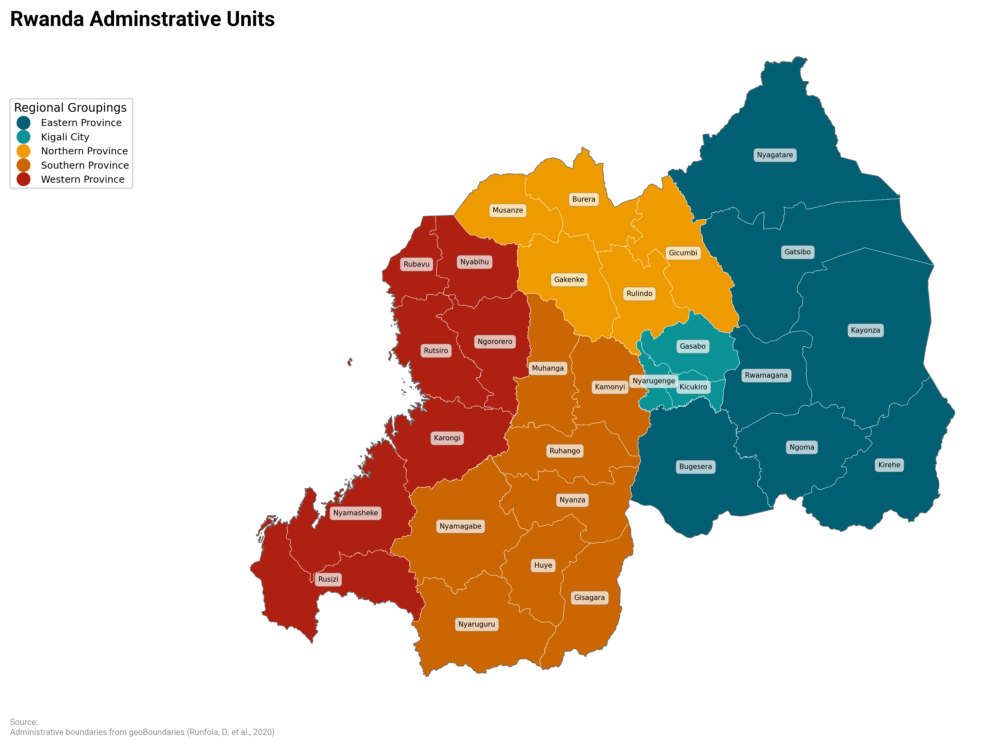

In [6]:
geoplot.plot_geoboundaries(
    adm_level="ADM2",
    group="ADM1"
);

## Plot Asset Distribution

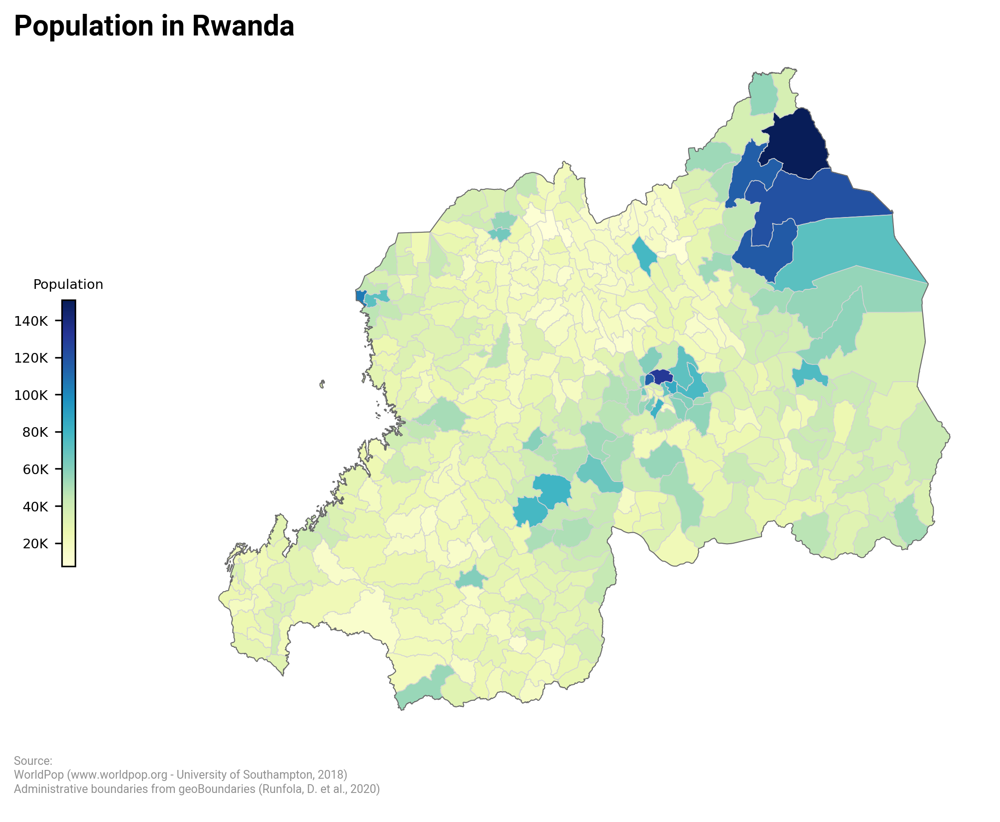

In [7]:
ax = geoplot.plot_choropleth(
    var="worldpop",
    kwargs={"legend_type": "colorbar"}
)

## Plot Conflict Count

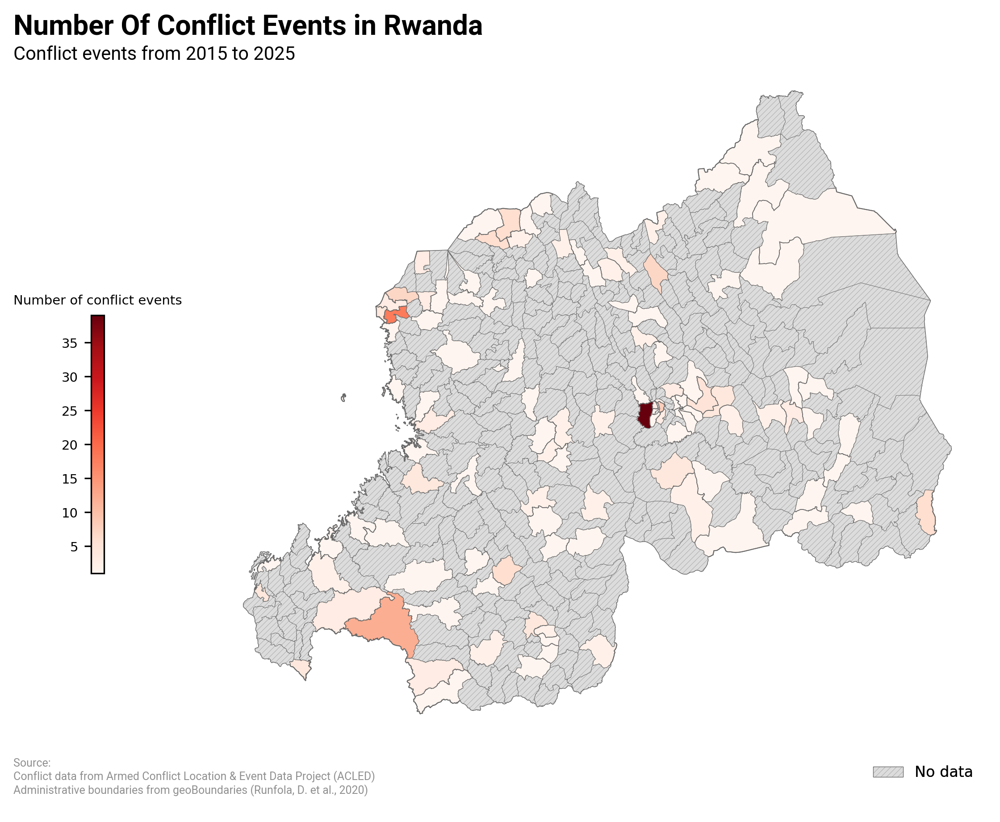

In [19]:
conflict_data_source = "ACLED" # @param ["ACLED", "UCDP"]

ax, x = geoplot.plot_choropleth(
    var=f"{conflict_data_source.lower()}_conflict_count",
    kwargs={
        "legend_type": "colorbar",
        "palette_name": "Reds",
        "edgecolor": "dimgray"
    }
)

In [ ]:
conflict_data_source = "ACLED" # @param ["ACLED", "UCDP"]

ax, x = geoplot.plot_choropleth(
    var=f"{conflict_data_source.lower()}_conflict_count",
    kwargs={
        "legend_type": "colorbar",
        "palette_name": "Reds",
        "edgecolor": "dimgray",
        "legend_y": 0.475
    }
)
geoplot.plot_points(
    "event_type",
    dataset=conflict_data_source.lower(),
    clustering=clustering, ax=ax, xpos=x,
    kwargs={"legend_y": 0.425, "labelspacing": 1.75}
);

## Plot Conflict Exposure

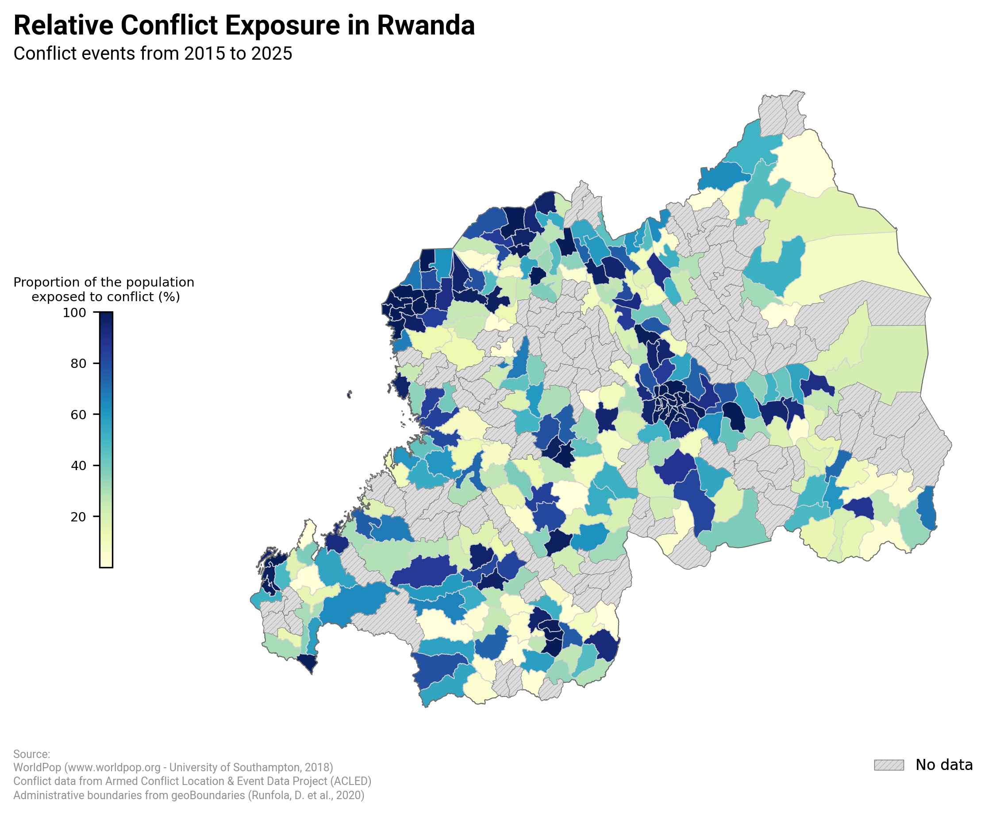

In [6]:
conflict_exposure_source = "ACLED (WBG calculation)" # @param ["ACLED (population_best)", "ACLED (WBG calculation)", "UCDP"]
exposure = "relative" # @param ["absolute", "relative"]

source = data_utils.get_conflict_source(dm, conflict_exposure_source)
exposure = data_utils.get_exposure(dm, exposure)

ax, x = geoplot.plot_choropleth(
    var=f"{source}_{exposure}",
    kwargs={"legend_type": "colorbar"}
);

### Zoom choropleth to a specific region

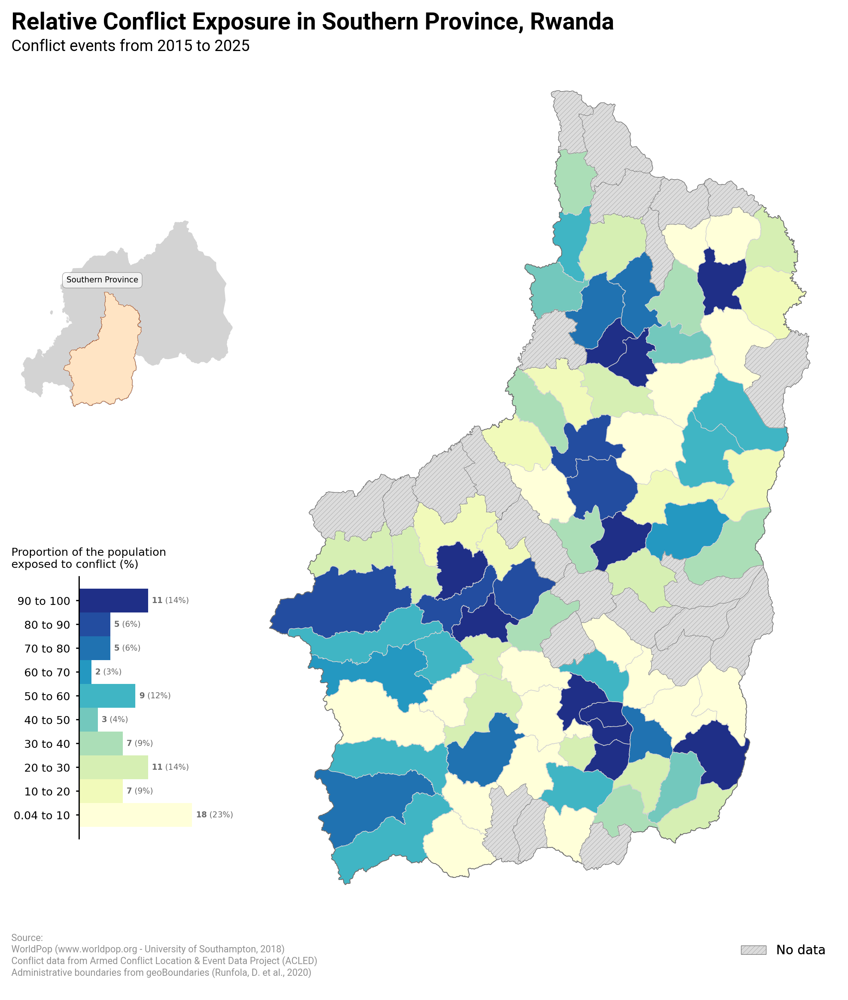

In [11]:
conflict_exposure_source = "ACLED (WBG calculation)" # @param ["ACLED (population_best)", "ACLED (WBG calculation)", "UCDP"]
exposure = "relative" # @param ["absolute", "relative"]

source = data_utils.get_conflict_source(dm, conflict_exposure_source)
exposure = data_utils.get_exposure(dm, exposure)

adm_level = "ADM1" # @param ["ADM1", "ADM2", "ADM3"]
adm_string = "Southern Province" # @param {type: "string"}

geoplot.plot_choropleth(
    var=f"{source}_{exposure}",
    zoom_to={adm_level: adm_string},
    #var_bounds=[0, 100]
);

## Map Exposure to a Single Hazard

/usr/local/lib/python3.12/dist-packages/dfcv_colocation_mapping/map_utils.py:310: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.ax.set_yticklabels(cbar.ax.get_yticklabels(), fontsize=config["cbar_fontsize"])


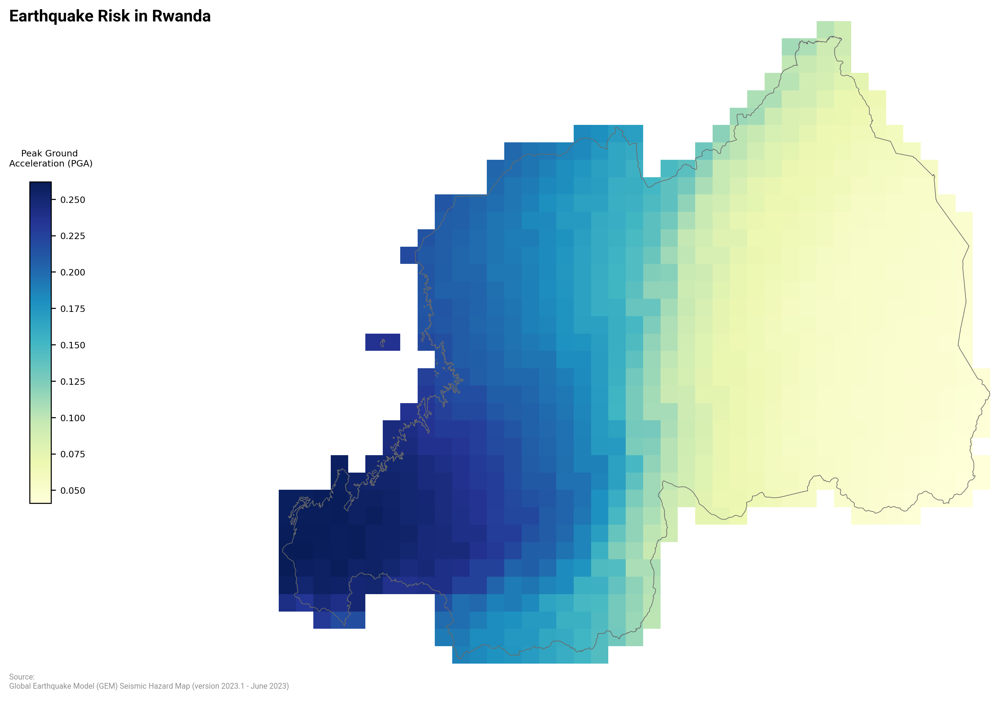

In [ ]:
hazard = "earthquake" # @param ["earthquake", "landslide", "cyclone", "drought", "heat_stress", "fluvial_flood"]
geoplot.plot_raster(hazard);

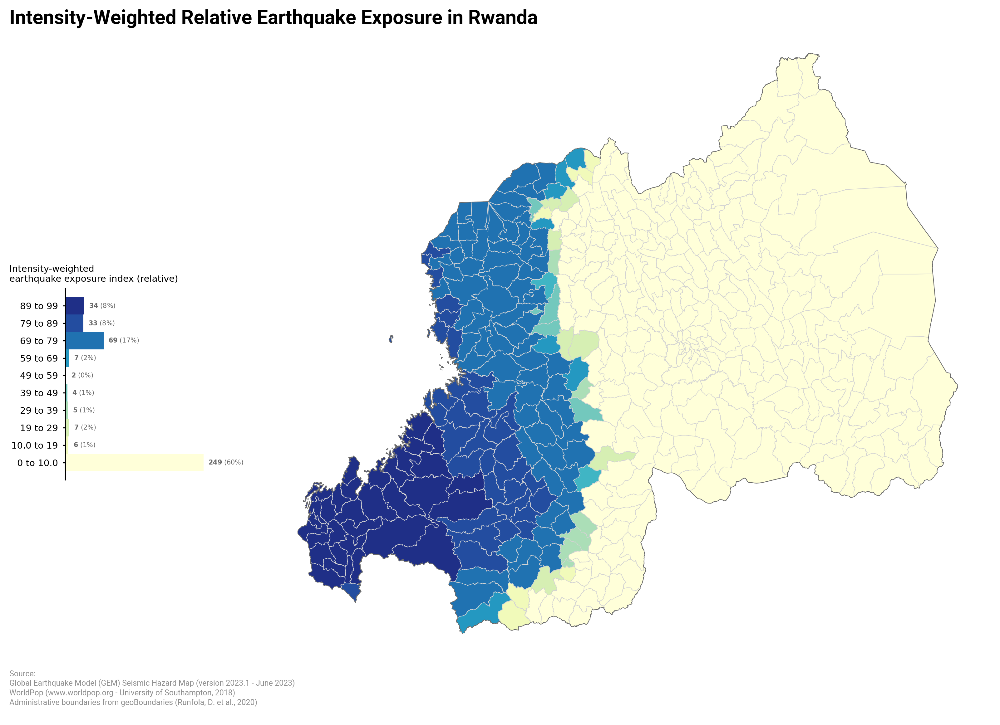

In [8]:
hazard = "earthquake" # @param ["earthquake", "landslide", "cyclone", "drought", "heat_stress", "fluvial_flood"]
exposure = "intensity_weighted_relative" # @param ["absolute", "relative", "intensity_weighted_relative"]
exposure = data_utils.get_exposure(dm, exposure)

geoplot.plot_choropleth(
    f"{hazard}_{dm.asset}_{exposure}",
    #kwargs={"legend_type": "colorbar"}
);

## Multi-hazard Exposure Index

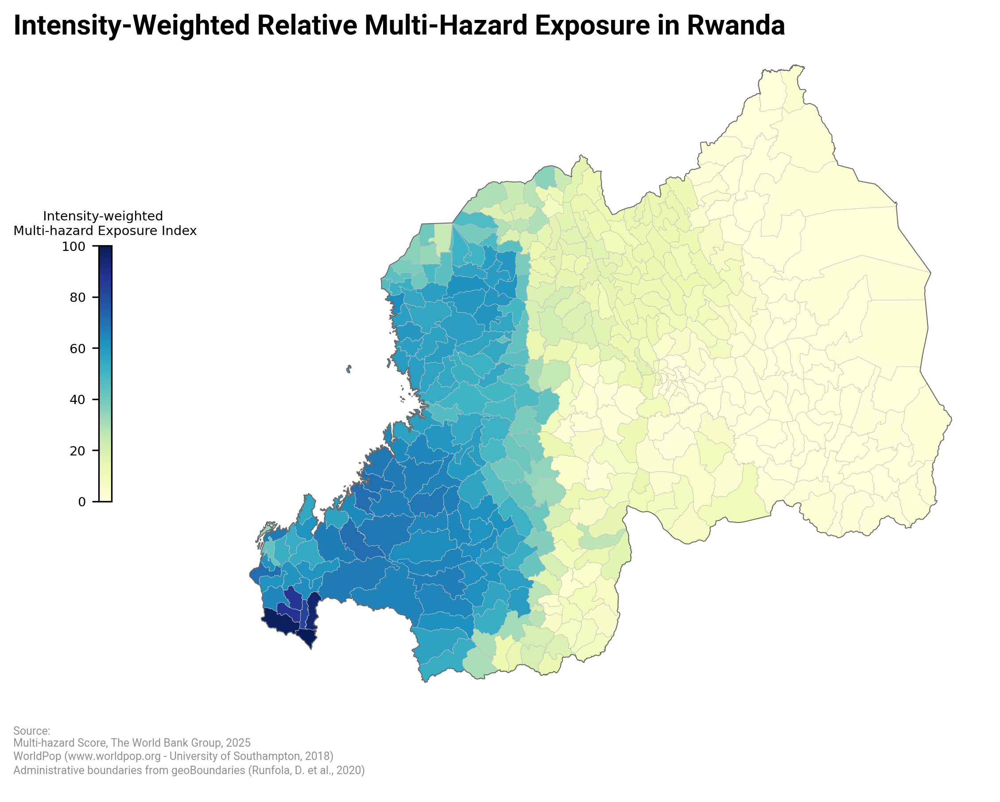

In [ ]:
exposure = "intensity_weighted_relative" # @param ["relative", "intensity_weighted_relative"]
exposure = data_utils.get_exposure(dm, exposure)

geoplot.plot_choropleth(
    var=f"mhs_{dm.asset}_{exposure}",
    kwargs={
        "legend_type": "colorbar",
        "edgecolor": "silver",
        "linewidth": 0.2
    }
);

## Generating Multi-hazard Conflict Exposure Choropleth Maps

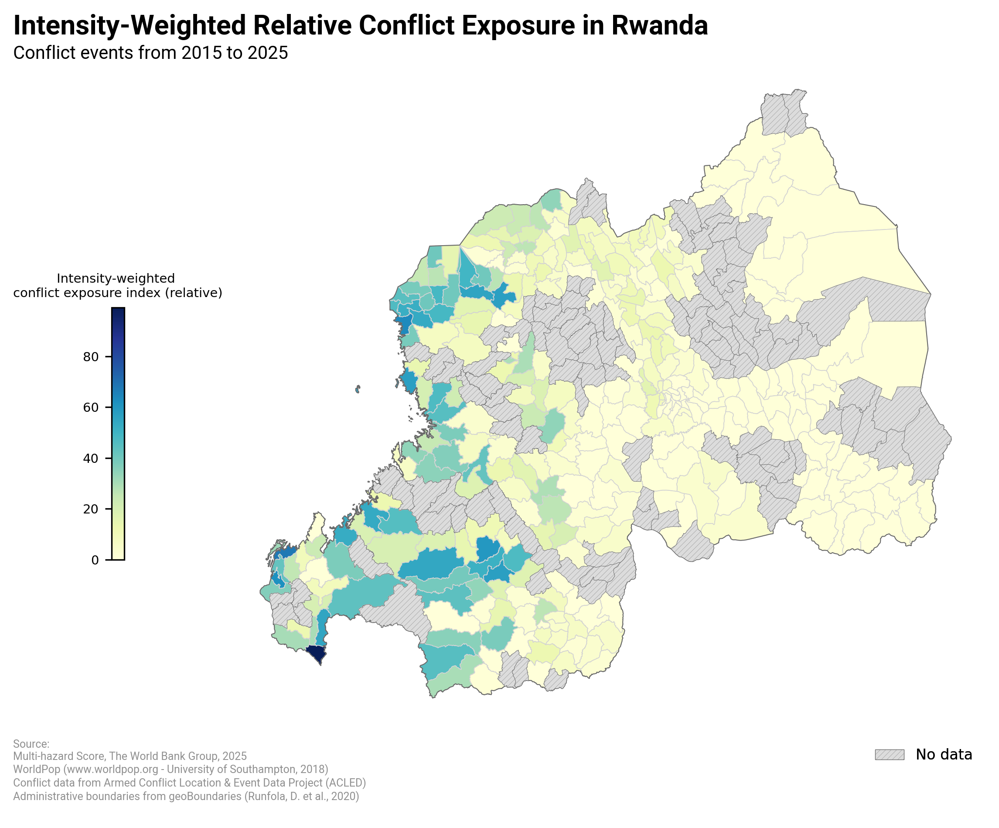

In [18]:
conflict_exposure_source = "ACLED (WBG calculation)" # @param ["ACLED (WBG calculation)", "UCDP"]
source = data_utils.get_conflict_source(dm, conflict_exposure_source)

mhs_exposure = "intensity_weighted_relative" # @param ["relative", "intensity_weighted_relative"]
exposure = data_utils.get_exposure(dm, mhs_exposure)

geoplot.plot_choropleth(
    var=f"mhs_{source}_{exposure}",
    kwargs={"legend_type": "colorbar"}
);

## Generating Multi-hazard Conflict Exposure Bi-variate Choropleth Maps

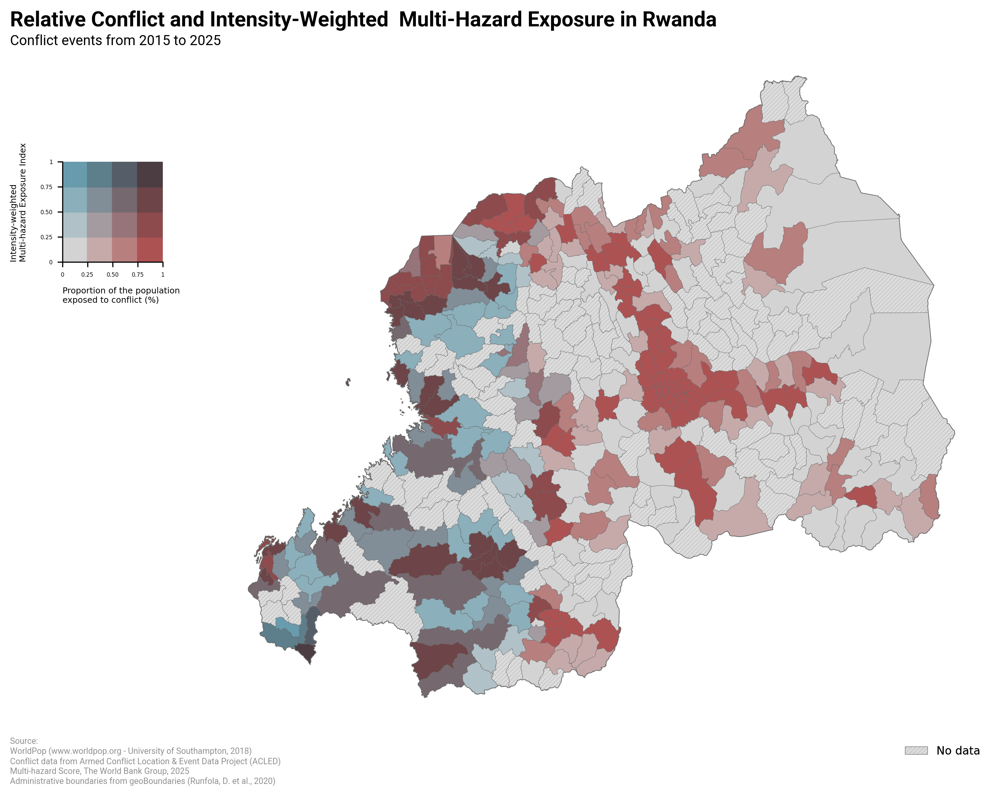

In [19]:
conflict_exposure_source = "ACLED (WBG calculation)" # @param ["ACLED (WBG calculation)", "UCDP"]
conflict_exposure = "relative" # @param ["absolute", "relative"]

source = data_utils.get_conflict_source(dm, conflict_exposure_source)
conflict_exposure = data_utils.get_exposure(dm, conflict_exposure)

mhs_exposure = "intensity_weighted_relative" # @param ["relative", "intensity_weighted_relative"]
mhs_exposure = data_utils.get_exposure(dm, mhs_exposure)

geoplot.plot_bivariate_choropleth(
    var1=f"{source}_{conflict_exposure}",
    var2=f"mhs_{dm.asset}_{mhs_exposure}",
    var1_bounds=[0, 1],
    var2_bounds=[0, 1],
    binning="equal_intervals",
    kwargs={
        "legend_fontsize": 4,
        "edgecolor": "dimgray",
        "linewidth": 0.2
    }
);

### Zoom bivariate choropleth to a specific region

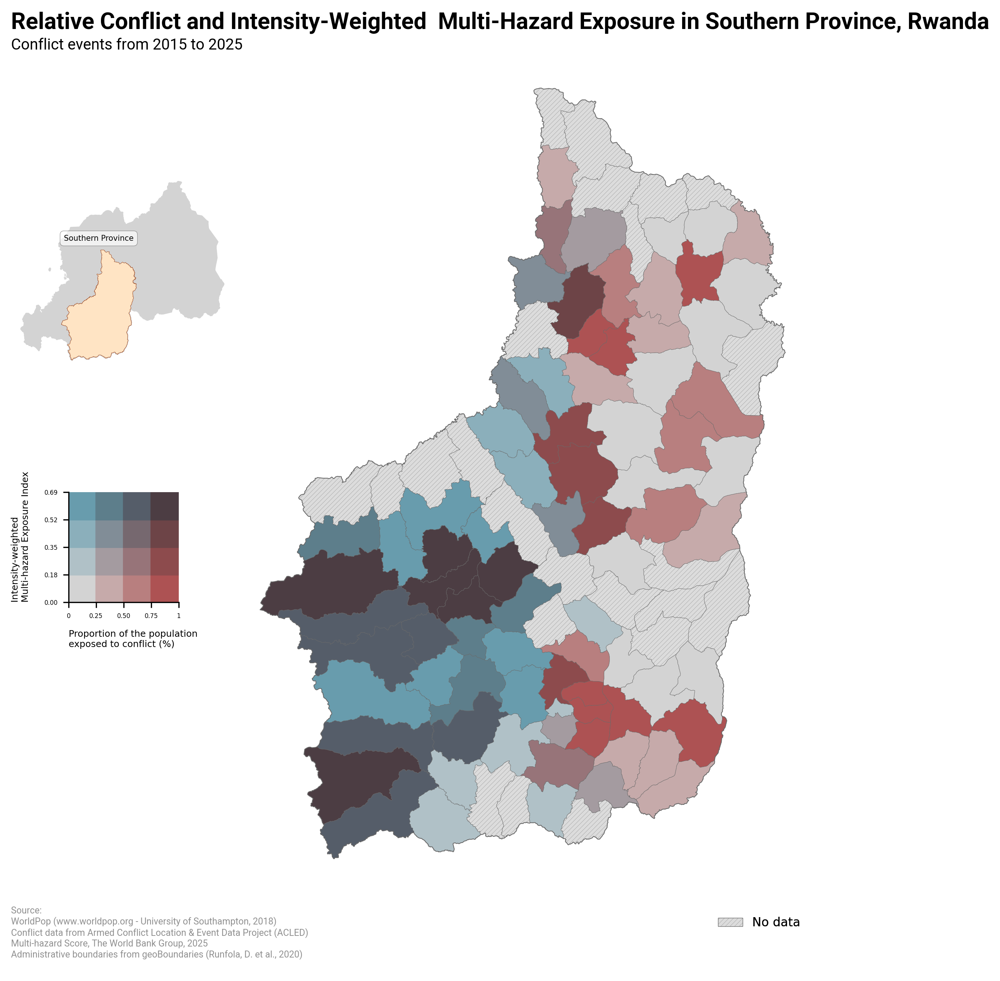

In [16]:
conflict_exposure_source = "ACLED (WBG calculation)" # @param ["ACLED (WBG calculation)", "UCDP"]
conflict_exposure = "relative" # @param ["absolute", "relative"]

source = data_utils.get_conflict_source(dm, conflict_exposure_source)
conflict_exposure = data_utils.get_exposure(dm, conflict_exposure)

mhs_exposure = "intensity_weighted_relative" # @param ["relative", "intensity_weighted_relative"]
mhs_exposure = data_utils.get_exposure(dm, mhs_exposure)

adm_level = "ADM1" # @param ["ADM1", "ADM2", "ADM3"]
adm_string = "Southern Province" # @param {type: "string"}

geoplot.plot_bivariate_choropleth(
    var1=f"{source}_{conflict_exposure}",
    var2=f"mhs_{dm.asset}_{mhs_exposure}",
    zoom_to={adm_level: adm_string},
    #var1_bounds=[0, 1],
    #var2_bounds=[0, 1],
    binning="equal_intervals",
    kwargs={
        "legend_fontsize": 4,
        "edgecolor": "dimgray",
        "linewidth": 0.2
    },
);

## Interactive Mapping with Folium

In [ ]:
m = geoplot.plot_folium(
    adm_level=adm_level,
    var="mhs_wbg_acled_worldpop_intensity_weighted_exposure_relative"
)
m